# Semantic segmentation with deep learning
> A guide for using deep-learning based semantic segmentation to land use / land cover in satellite imagery.

In this tutorial we will learn how to segment images according to a set of classes. **Segmentation**  refers to the process of partitioning an image into groups of pixels that identify with a target class within the foreground or the background class (a catch-all class that contains non-target features).

Specifically, in this tutorial we will be using data from two reference datasets, Imaflora and Para, depicting land use classifications of relevant areas in the Amazon. 

We will pair the reference data with a Planet 5 meter composite made from data available as part of the NICFI program. Our task will be to predict the land use / land cover in an image on a pixel-wise basis. 

## Specific concepts that will be covered
In the process, we will build practical experience and develop intuition around the following concepts:
* **[Functional API](https://keras.io/getting-started/functional-api-guide/)** - we will be implementing UNet, a convolutional network model classically used for biomedical image segmentation with the Functional API. 
  * This model has layers that require multiple input/outputs. This requires the use of the functional API
  * Check out the original [paper](https://arxiv.org/abs/1505.04597), 
U-Net: Convolutional Networks for Biomedical Image Segmentation by Olaf Ronneberger!
* **Loss Functions and Metrics** - We'll implement the **Sparse Categorical [focal loss](https://focal-loss.readthedocs.io/en/latest/) function**
 and **accuracy**. We'll also generate confusion matrices during evaluation to judge how well the model performs. 
* **Saving and loading Keras models** - We'll save our best model to file. When we want to perform inference/evaluate our model in the future, we can load the model file. 

### General Workflow
1. Load image and label datasets from Google Drive
2. Visualize data/perform some exploratory data analysis
3. Set up data pipeline and preprocessing
4. Build model
5. Train model
6. Test model

### Objectives
1. Practice with the Keras Functional API as a means to run TensorFlow models
2. Experience training a segmentation model and monitoring progress
3. Learn how to generate predictions with a trained segmentation model


**Audience:** This post is geared towards intermediate users who are comfortable with basic machine learning concepts. 

**Time Estimated**: 60-120 min



## Setup Notebook

```{admonition} **Version control**
Colab updates without warning to users, which can cause notebooks to break. Therefore, we are pinning library versions.
``` 

In [ ]:
!python --version

Python 3.7.12


In [ ]:
!pip --version

pip 21.1.3 from /usr/local/lib/python3.7/dist-packages/pip (python 3.7)


In [ ]:
!pip install pip==21.1.3

In [1]:
# install required libraries
!pip install -q rasterio==1.2.10
!pip install -q geopandas==0.10.2
!pip install -q git+https://github.com/tensorflow/examples.git
!pip install -q -U tfds-nightly
!pip install -q focal-loss
!pip install -q tensorflow-addons==0.8.3
!pip install -q matplotlib==3.5
!pip install -q scikit-learn==1.0.1
!pip install -q scikit-image==0.18.3

     |████████████████████████████████| 19.3 MB 273 kB/s 
     |████████████████████████████████| 1.0 MB 9.9 MB/s 
     |████████████████████████████████| 15.4 MB 48.7 MB/s 
     |████████████████████████████████| 6.3 MB 82.1 MB/s 
    Running setup.py install for tensorflow-examples ... done
  DEPRECATION: tensorflow-examples was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.
     |████████████████████████████████| 4.0 MB 8.4 MB/s 
     |████████████████████████████████| 1.0 MB 9.0 MB/s 


In [2]:
# import required libraries
import os, glob, functools, fnmatch
from zipfile import ZipFile
from itertools import product

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
mpl.rcParams['figure.figsize'] = (12,12)

from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
import pandas as pd
from PIL import Image

import rasterio
from rasterio import features, mask

import geopandas as gpd

import tensorflow as tf
from tensorflow.python.keras import layers, losses, models
from tensorflow.python.keras import backend as K  
import tensorflow_addons as tfa
from keras.utils.vis_utils import plot_model

from tensorflow_examples.models.pix2pix import pix2pix

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

from IPython.display import clear_output
from time import sleep
from tqdm.notebook import tqdm

from focal_loss import SparseCategoricalFocalLoss
from sklearn.metrics import confusion_matrix, f1_score

#### Getting set up with the data

```{important}
Create drive shortcuts of the tiled imagery to your own My Drive Folder by Right-Clicking on the Shared folder `servir-tf-devseed`. Then, this folder will be available at the following path that is accessible with the google.colab `drive` module: `'/content/gdrive/My Drive/servir-tf-devseed/'`
```

We'll be working witht he following folders in the `servir-tf-devseed` folder:
```
servir-tf-devseed/
├── images/
├── images_bright/
├── indices/
├── indices_800/
├── labels/
├── labels_800/
├── background_list_train.txt
└── terrabio_classes.csv
```

In [3]:
# mount google drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
# set your root directory and tiled data folders
if 'google.colab' in str(get_ipython()):
    root_dir = '/content/gdrive/My Drive/servir-tf-devseed/'  
    print('Running on Colab')
else:
    root_dir = os.path.abspath("./data/servir-tf-devseed")
    print(f'Not running on Colab, data needs to be downloaded locally at {os.path.abspath(root_dir)}')

img_dir = os.path.join(root_dir,'indices/') # or os.path.join(root_dir,'images_bright/') if using the optical tiles
label_dir = os.path.join(root_dir,'labels/')

Running on Colab


In [5]:
# go to root directory
%cd $root_dir 

/content/gdrive/MyDrive/servir-tf/data/servir-tf-devseed


### Enabling GPU

This notebook can utilize a GPU and works better if you use one. Hopefully this notebook is using a GPU, and we can check with the following code.

If it's not using a GPU you can change your session/notebook to use a GPU. See [Instructions](https://colab.research.google.com/notebooks/gpu.ipynb#scrollTo=sXnDmXR7RDr2)

In [ ]:
# this is a google colab specific command to ensure TF version 2 is used. 
# it won't work in a regular jupyter notebook, for a regular notebook make sure you install TF version 2
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


### Check out the labels

In [6]:
# Read the classes
class_index = pd.read_csv(os.path.join(root_dir,'terrabio_classes.csv'))
class_names = class_index.class_name.unique()
print(class_index) 


   class_id   class_name
0         0   Background
1         1     Bushland
2         2      Pasture
3         3        Roads
4         4        Cocoa
5         5   Tree cover
6         6    Developed
7         7        Water
8         8  Agriculture


### Read into tensorflow datasets

Now we will compile the spectral index image and label tiles into training, validation, and test datasets for use with TensorFlow.

```{important}
Normally we would read the image files from the directories and then process forward from there with background removal with the next **three** illustrated functions, however, due to slow I/O in Google Colab we will read the images list with 90% background removal already performed from a pre-saved list in the shared drive.
```

```python
# get lists of image and label tile pairs for training and testing

def get_train_test_lists(imdir, lbldir):
  imgs = glob.glob(os.path.join(imdir,"/*.png"))
  #print(imgs[0:1])
  dset_list = []
  for img in imgs:
    filename_split = os.path.splitext(img) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    dset_list.append(basename)
    
  x_filenames = []
  y_filenames = []
  for img_id in dset_list:
    x_filenames.append(os.path.join(imdir, "{}.png".format(img_id)))
    y_filenames.append(os.path.join(lbldir, "{}.png".format(img_id)))
    
  print("number of images: ", len(dset_list))
  return dset_list, x_filenames, y_filenames

train_list, x_train_filenames, y_train_filenames = get_train_test_lists(img_dir, label_dir)

```
number of images:  37350

Check for the proportion of background tiles. This takes a while. So we can skip by loading from saved results.

```python
skip = True

if not skip:
  background_list_train = []
  for i in train_list: 
      # read in each labeled images
      # print(os.path.join(label_dir,"{}.png".format(i))) 
      img = np.array(Image.open(os.path.join(label_dir,"{}.png".format(i))))  
      # check if no values in image are greater than zero (background value)
      if img.max()==0:
          background_list_train.append(i)
          
  print("Number of background images: ", len(background_list_train))

  with open(os.path.join(root_dir,'background_list_train.txt'), 'w') as f:
    for item in background_list_train:
        f.write("%s\n" % item)

else:
  background_list_train = [line.strip() for line in open("background_list_train.txt", 'r')]
  print("Number of background images: ", len(background_list_train))
```
Number of background images:  36489

We will keep only 10% of the total. Too many background tiles can cause a form of class imbalance.
```python
background_removal = len(background_list_train) * 0.9
train_list_clean = [y for y in train_list if y not in background_list_train[0:int(background_removal)]]

x_train_filenames = []
y_train_filenames = []

for i, img_id in zip(tqdm(range(len(train_list_clean))), train_list_clean):
  pass 
  x_train_filenames.append(os.path.join(img_dir, "{}.png".format(img_id)))
  y_train_filenames.append(os.path.join(label_dir, "{}.png".format(img_id)))

print("Number of background tiles: ", background_removal)
print("Remaining number of tiles after 90% background removal: ", len(train_list_clean))
```
Number of background tiles:  32840.1

Remaining number of tiles after 90% background removal:  4510



```{important}
The cell below contains the shortcut read of prepped training image list. 
```

In [7]:
  def get_train_test_lists(imdir, lbldir):
    train_list = [line.strip() for line in open("train_list_clean.txt", 'r')]

    x_filenames = []
    y_filenames = []
    for img_id in train_list:
      x_filenames.append(os.path.join(imdir, "{}.png".format(img_id)))
      y_filenames.append(os.path.join(lbldir, "{}.png".format(img_id)))

    print("Number of images: ", len(train_list))
    return train_list, x_filenames, y_filenames

In [8]:
train_list, x_train_filenames, y_train_filenames = get_train_test_lists(img_dir, label_dir)

Number of images:  4510


Now that we have our set of files we want to use for developing our model, we need to split them into three sets: 
* the training set for the model to learn from
* the validation set that allows us to evaluate models and make decisions to change models
* and the test set that we will use to communicate the results of the best performing model (as determined by the validation set)

We will split index tiles and label tiles into train, validation and test sets: 70%, 20% and 10%, respectively.

In [9]:
x_train_filenames, x_val_filenames, y_train_filenames, y_val_filenames = train_test_split(x_train_filenames, y_train_filenames, test_size=0.3, random_state=42)
x_val_filenames, x_test_filenames, y_val_filenames, y_test_filenames = train_test_split(x_val_filenames, y_val_filenames, test_size=0.33, random_state=42)

num_train_examples = len(x_train_filenames)
num_val_examples = len(x_val_filenames)
num_test_examples = len(x_test_filenames)

print("Number of training examples: {}".format(num_train_examples))
print("Number of validation examples: {}".format(num_val_examples))
print("Number of test examples: {}".format(num_test_examples))

Number of training examples: 3157
Number of validation examples: 906
Number of test examples: 447


#### The code below checks for values in train, val, and test partitions. We won't run this since it takes over 10 minutes on colab due to slow I/O.

```python
vals_train = []
vals_val = []
vals_test = []

def get_vals_in_partition(partition_list, x_filenames, y_filenames):
  for x,y,i in zip(x_filenames, y_filenames, tqdm(range(len(y_filenames)))):
      pass 
      try:
        img = np.array(Image.open(y)) 
        vals = np.unique(img)
        partition_list.append(vals)
      except:
        continue

def flatten(partition_list):
    return [item for sublist in partition_list for item in sublist]

get_vals_in_partition(vals_train, x_train_filenames, y_train_filenames)
get_vals_in_partition(vals_val, x_val_filenames, y_val_filenames)
get_vals_in_partition(vals_test, x_test_filenames, y_test_filenames)

print("Values in training partition: ", set(flatten(vals_train)))
print("Values in validation partition: ", set(flatten(vals_val)))
print("Values in test partition: ", set(flatten(vals_test)))
```


Values in training partition:  {0, 1, 2, 3, 4, 5, 6, 7, 8}

Values in validation partition:  {0, 1, 2, 3, 4, 5, 6, 7, 8}

Values in test partition:  {0, 1, 2, 3, 4, 5, 6, 7, 8}

### Visualize the data

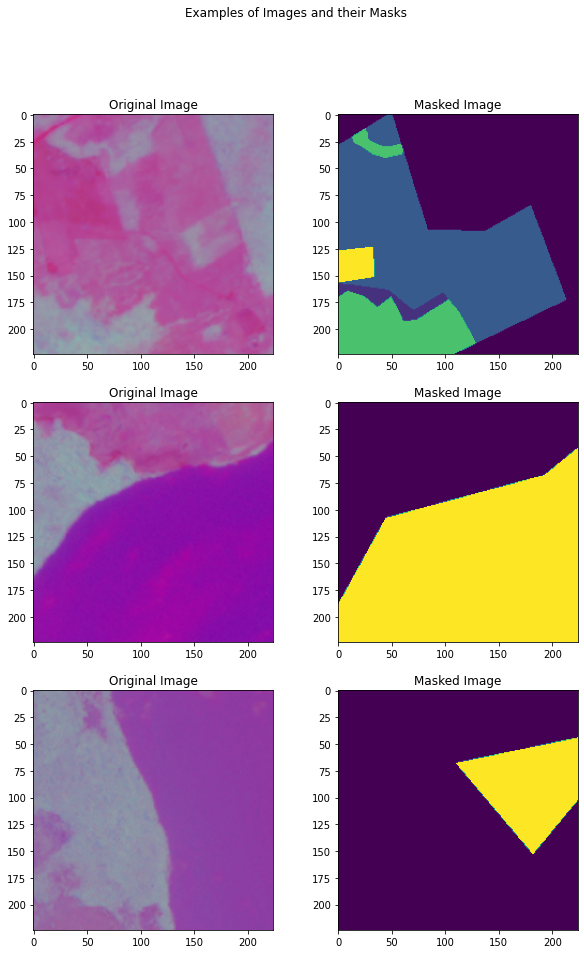

In [34]:
display_num = 3

background_list_train = [line.strip() for line in open("background_list_train.txt", 'r')]

# select only for tiles with foreground labels present
foreground_list_x = []
foreground_list_y = []
for x,y in zip(x_train_filenames, y_train_filenames): 
    try:
      filename_split = os.path.splitext(y) 
      filename_zero, fileext = filename_split 
      basename = os.path.basename(filename_zero) 
      if basename not in background_list_train:
        foreground_list_x.append(x)
        foreground_list_y.append(y)
      else:
        continue
    except:
      continue

num_foreground_examples = len(foreground_list_y)

# randomlize the choice of image and label pairs
r_choices = np.random.choice(num_foreground_examples, display_num)

plt.figure(figsize=(10, 15))
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]
  x_pathname = foreground_list_x[img_num]
  y_pathname = foreground_list_y[img_num]
  
  plt.subplot(display_num, 2, i + 1)
  plt.imshow(mpimg.imread(x_pathname))
  plt.title("Original Image")
  
  example_labels = Image.open(y_pathname)
  label_vals = np.unique(np.array(example_labels))
  
  plt.subplot(display_num, 2, i + 2)
  plt.imshow(example_labels)
  plt.title("Masked Image")  
  
plt.suptitle("Examples of Images and their Masks")
plt.show()

### Read the tiles into tensors

In [18]:
# set input image shape
img_shape = (224, 224, 3)
# set batch size for model
batch_size = 8

In [19]:
# Function for reading the tiles into TensorFlow tensors 
# See TensorFlow documentation for explanation of tensor: https://www.tensorflow.org/guide/tensor
def _process_pathnames(fname, label_path):
  # We map this function onto each pathname pair  
  img_str = tf.io.read_file(fname)
  img = tf.image.decode_png(img_str, channels=3)

  label_img_str = tf.io.read_file(label_path)

  # These are png images so they return as (num_frames, h, w, c)
  label_img = tf.image.decode_png(label_img_str, channels=1)
  # The label image should have any values between 0 and 8, indicating pixel wise
  # foreground class or background (0). We take the first channel only. 
  label_img = label_img[:, :, 0]
  label_img = tf.expand_dims(label_img, axis=-1)
  return img, label_img

In [20]:
# Function to augment the data with horizontal flip
def flip_img_h(horizontal_flip, tr_img, label_img):
  if horizontal_flip:
    flip_prob = tf.random.uniform([], 0.0, 1.0)
    tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_left_right(tr_img), tf.image.flip_left_right(label_img)),
                                lambda: (tr_img, label_img))
  return tr_img, label_img

In [21]:
# Function to augment the data with vertical flip
def flip_img_v(vertical_flip, tr_img, label_img):
  if vertical_flip:
    flip_prob = tf.random.uniform([], 0.0, 1.0)
    tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_up_down(tr_img), tf.image.flip_up_down(label_img)),
                                lambda: (tr_img, label_img))
  return tr_img, label_img

In [22]:
# Function to augment the images and labels
def _augment(img,
             label_img,
             resize=None,  # Resize the image to some size e.g. [256, 256]
             #scale=1,  # Scale image e.g. 1 / 255.
             horizontal_flip=False,
             vertical_flip=False): 
  if resize is not None:
    # Resize both images
    label_img = tf.image.resize(label_img, resize)
    img = tf.image.resize(img, resize)
  
  img, label_img = flip_img_h(horizontal_flip, img, label_img)
  img, label_img = flip_img_v(vertical_flip, img, label_img)
  img = tf.cast(img, tf.float32) # * scale  #tf.to_float(img) * scale 
  #label_img = tf.cast(label_img, tf.float32) * scale
  #print("tensor: ", tf.unique(tf.keras.backend.print_tensor(label_img)))
  return img, label_img

In [23]:
# Main function to tie all of the above four dataset processing functions together 
def get_baseline_dataset(filenames, 
                         labels,
                         preproc_fn=functools.partial(_augment),
                         threads=5, 
                         batch_size=batch_size,
                         shuffle=True):           
  num_x = len(filenames)
  # Create a dataset from the filenames and labels
  dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
  # Map our preprocessing function to every element in our dataset, taking
  # advantage of multithreading
  dataset = dataset.map(_process_pathnames, num_parallel_calls=threads)
  if preproc_fn.keywords is not None and 'resize' not in preproc_fn.keywords:
    assert batch_size == 1, "Batching images must be of the same size"

  dataset = dataset.map(preproc_fn, num_parallel_calls=threads)
  
  if shuffle:
    dataset = dataset.shuffle(num_x)
  
  
  # It's necessary to repeat our data for all epochs 
  dataset = dataset.repeat().batch(batch_size)
  return dataset

In [35]:
# dataset configuration for training
tr_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    #'scale': 1 / 255.,
    'horizontal_flip': True,
    'vertical_flip': True,
}
tr_preprocessing_fn = functools.partial(_augment, **tr_cfg)

In [36]:
# dataset configuration for validation
val_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    #'scale': 1 / 255.,
}
val_preprocessing_fn = functools.partial(_augment, **val_cfg)

In [37]:
# dataset configuration for testing
test_cfg = {
    'resize': [img_shape[0], img_shape[1]],
    #'scale': 1 / 255.,
}
test_preprocessing_fn = functools.partial(_augment, **test_cfg)

In [38]:
# create the TensorFlow datasets
train_ds = get_baseline_dataset(x_train_filenames,
                                y_train_filenames,
                                preproc_fn=tr_preprocessing_fn,
                                batch_size=batch_size)
val_ds = get_baseline_dataset(x_val_filenames,
                              y_val_filenames, 
                              preproc_fn=val_preprocessing_fn,
                              batch_size=batch_size)
test_ds = get_baseline_dataset(x_test_filenames,
                              y_test_filenames, 
                              preproc_fn=test_preprocessing_fn,
                              batch_size=batch_size)

In [39]:
# Now we will display some samples from the datasets
display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=tr_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]

In [40]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

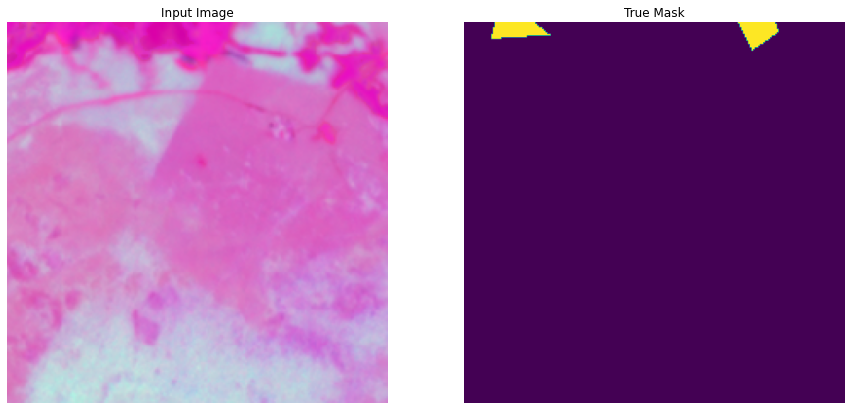

In [41]:
# display sample train image
display([sample_image, sample_mask])

...same check for the validation images:

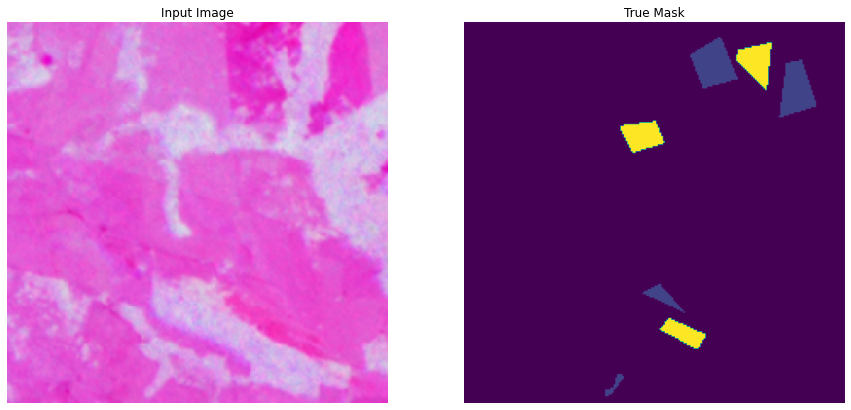

In [42]:
# reset the forground list to capture the validation images
foreground_list_x = []
foreground_list_y = []
for x,y in zip(x_val_filenames, y_val_filenames): 
    try:
      filename_split = os.path.splitext(y) 
      filename_zero, fileext = filename_split 
      basename = os.path.basename(filename_zero) 
      if basename not in background_list_train:
        foreground_list_x.append(x)
        foreground_list_y.append(y)
      else:
        continue
    except:
      continue

num_foreground_examples = len(foreground_list_y)

display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=val_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]

# display sample validation image
display([sample_image, sample_mask])

...same check for the test images:


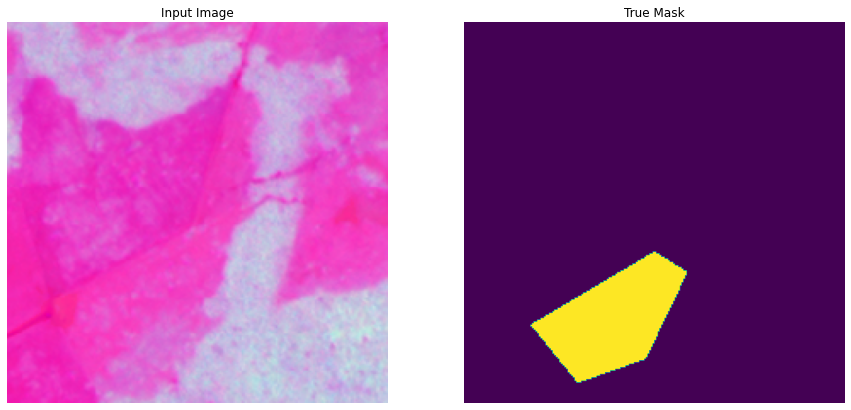

In [43]:
# reset the forground list to capture the test images
foreground_list_x = []
foreground_list_y = []
for x,y in zip(x_test_filenames, y_test_filenames): 
    try:
      filename_split = os.path.splitext(y) 
      filename_zero, fileext = filename_split 
      basename = os.path.basename(filename_zero) 
      if basename not in background_list_train:
        foreground_list_x.append(x)
        foreground_list_y.append(y)
      else:
        continue
    except:
      continue

num_foreground_examples = len(foreground_list_y)

display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=test_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]

# display sample test image
display([sample_image, sample_mask])

### Define the model

The model being used here is a modified U-Net. A U-Net consists of an encoder (downsampler) and decoder (upsampler). In-order to learn robust features, and reduce the number of trainable parameters, an optionally pretrained model can be used as the encoder. Thus, the encoder for this task will be a pretrained MobileNetV2 model, whose intermediate outputs will be used, and the decoder will be the upsample block already implemented in TensorFlow Examples in the Pix2pix tutorial.

:::{figure-md} Unet_mobilenetv2_arch_arch-fig
<img src="images/Unet_mobilenetv2_arch_arch.png" width="650px">

U-shaped MobileNetV2 (adapted U-Net) architecture diagram (from [Ronneberger et al., 2015](https://www.researchgate.net/publication/339266308_Surface-Defect_Segmentation_using_U-shaped_Inverted_Residuals)). 
:::

The reason to output nine channels is because there are nine possible labels for each pixel. Think of this as multi-classification where each pixel is being classified into nine classes.

In [44]:
# set number of model output channels to the number of classes (including background)
OUTPUT_CHANNELS = 9 

As mentioned, the encoder will be an optionally pretrained MobileNetV2 model which is prepared and ready to use in tf.keras.applications. The encoder consists of specific outputs from intermediate layers in the model. Note that the encoder will be trained during the training process, as it would necessitate optical imagery if transfer learning were to be used, and in this example we are using spectral indices.

In [45]:
base_model = tf.keras.applications.MobileNetV2(input_shape=[224, 224, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',
    'block_3_expand_relu',
    'block_6_expand_relu',
    'block_13_expand_relu', 
    'block_16_project', 
]
layers = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=layers)

down_stack.trainable = True # Set this to False if using pre-trained weights

9420800/9406464 [==============================] - 0s 0us/step


The decoder/upsampler is simply a series of upsample blocks implemented in TensorFlow examples.

In [46]:
up_stack = [
    pix2pix.upsample(512, 3),
    pix2pix.upsample(256, 3),
    pix2pix.upsample(128, 3),
    pix2pix.upsample(64, 3),
]

In [47]:
def unet_model(output_channels):
  inputs = tf.keras.layers.Input(shape=[224,224,3])
  x = inputs

  # Downsampling through the model
  skips = down_stack(x)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    concat = tf.keras.layers.Concatenate()
    x = concat([x, skip])

  # This is the last layer of the model
  last = tf.keras.layers.Conv2DTranspose(
      output_channels, 3, strides=2,
      padding='same')  #64x64 -> 224x224

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

### Train the model

Now, all that is left to do is to compile and train the model. The loss being used here is SparseCategoricalFocalLoss(from_logits=True). The reason to use this loss function is 1) because the network is trying to assign each pixel a label, just like multi-class prediction, and 2) because focal loss weights the relative contribution of each class by the distribution in the dataset to emphasize under-represented classes and dampen over-represented classes. In the true segmentation mask, each pixel has a value between 0-9. The network here is outputting ten channels. Essentially, each channel is trying to learn to predict a class, and losses.SparseCategoricalCrossentropy(from_logits=True) is the recommended loss for such a scenario. Using the output of the network, the label assigned to the pixel is the channel with the highest value. This is what the create_mask function is doing.

In [48]:
model = unet_model(OUTPUT_CHANNELS)

Check the compiled network

In [49]:
print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 112, 112, 9  1841984     ['input_2[0][0]']                
                                6),                                                               
                                 (None, 56, 56, 144                                               
                                ),                                                                
                                 (None, 28, 28, 192                                         

We will measure our model's performance during training by per-pixel accuracy.

In [50]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
              loss=SparseCategoricalFocalLoss(gamma=2, from_logits=True),
              metrics=['accuracy'])


Let's try out the un/pre-trained model to see what it predicts before training.

In [51]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

In [52]:
def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    mp = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    mpe = tf.keras.backend.eval(mp)
    display([sample_image, sample_mask, mpe])

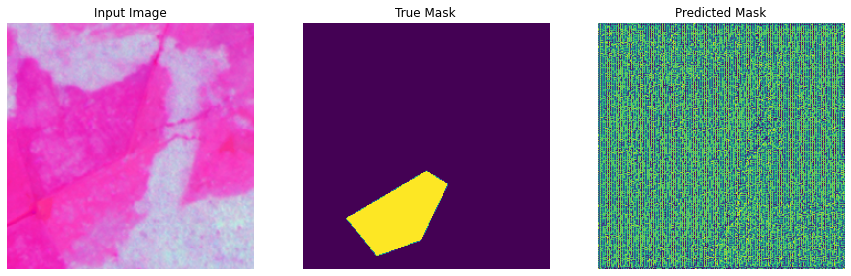

In [53]:
show_predictions()

Let's observe how the model improves while it is training. To accomplish this task, a callback function is defined below to plot a validation image and it's predicted mask after each epoch.

In [54]:
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

#### Fit and View
Now we will actually train the model for 50 epochs (full cycles through the training dataset), visualizing predictions on a validation image after each epoch.

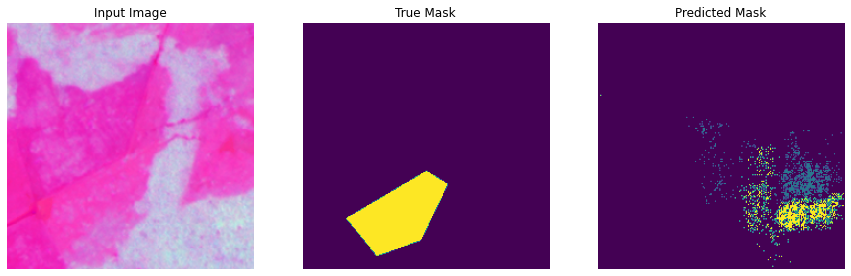


Sample Prediction after epoch 50

395/395 [==============================] - 38s 95ms/step - loss: 0.0253 - accuracy: 0.9830 - val_loss: 0.0533 - val_accuracy: 0.9665


In [55]:
EPOCHS = 50

model_history = model.fit(train_ds, 
                   steps_per_epoch=int(np.ceil(num_train_examples / float(batch_size))),
                   epochs=EPOCHS,
                   validation_data=val_ds,
                   validation_steps=int(np.ceil(num_val_examples / float(batch_size))),
                   callbacks=[DisplayCallback()]) 

Plot the model's learning curve over time.

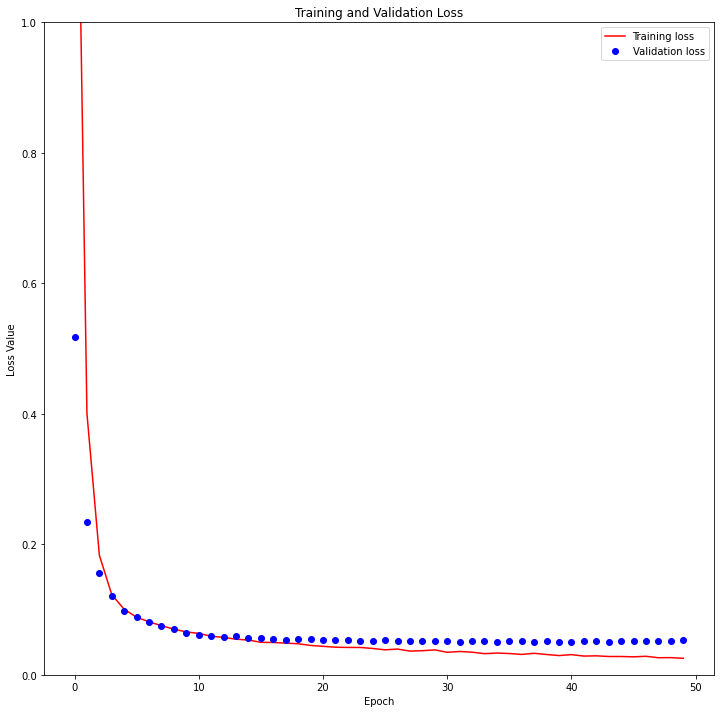

In [56]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'bo', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

---------------------------------

#### Save model to file

We will export the final model weights.

In [57]:
save_model_path = os.path.join(root_dir,'indices_model_out_lr00001_batchs8_ep50_nopretrain_noscaleaug/')
if (not os.path.isdir(save_model_path)):
  os.mkdir(save_model_path)
model.save(save_model_path)

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/servir-tf-devseed/indices_model_out_lr00001_batchs8_ep50_nopretrain_noscaleaug/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


### Make predictions

Let's make some predictions. In the interest of saving time, the number of epochs was kept small, but you may set this higher to achieve more accurate results.

In [58]:
# Optional, you can load the model from the saved version
load_from_checkpoint = False
if load_from_checkpoint == True:
  model = tf.keras.models.load_model(save_model_path)
else:
  print("inferencing from in memory model")

inferencing from in memory model


In [59]:
def get_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = model.predict(image)
      return pred_mask
  else:
    pred_mask = create_mask(model.predict(sample_image[tf.newaxis, ...]))
    pred_mask = tf.keras.backend.eval(pred_mask)
    return pred_mask

#### Single image example

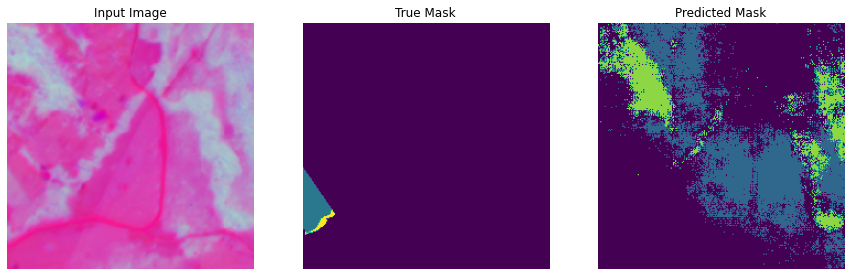

In [60]:
display_num = 1
r_choices = np.random.choice(num_foreground_examples, 1)
for i in range(0, display_num * 2, 2):
  img_num = r_choices[i // 2]

temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                               foreground_list_y[img_num:img_num+1],
                               preproc_fn=test_preprocessing_fn,
                               batch_size=1,
                               shuffle=False)

# Let's examine some of these augmented images

iterator = iter(temp_ds)
next_element = iterator.get_next()

batch_of_imgs, label = next_element

# Running next element in our graph will produce a batch of images

sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]

# run and plot predicitions
pred_mask = get_predictions()

show_predictions()

#### Multi image example

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_21138.png']
[0 2 5 6 7]


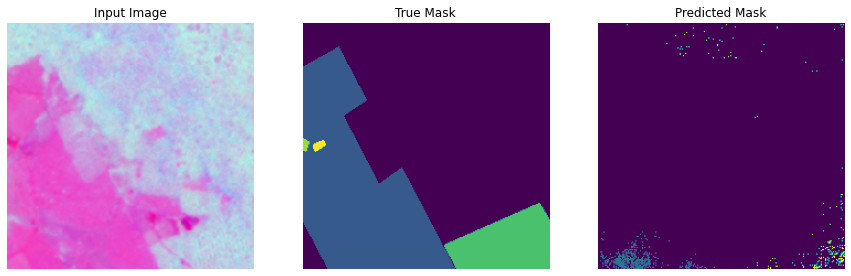

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_21426.png']
[0 5]


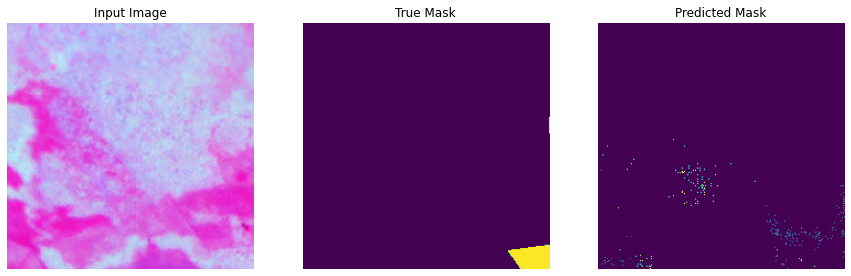

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_15673.png']
[0 2 5]


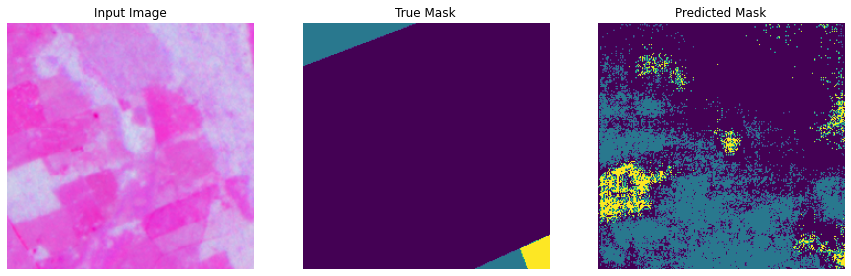

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_32990.png']
[0 5]


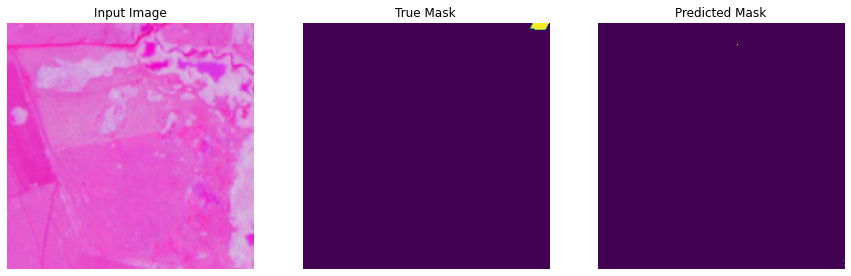

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_15379.png']
[0 2]


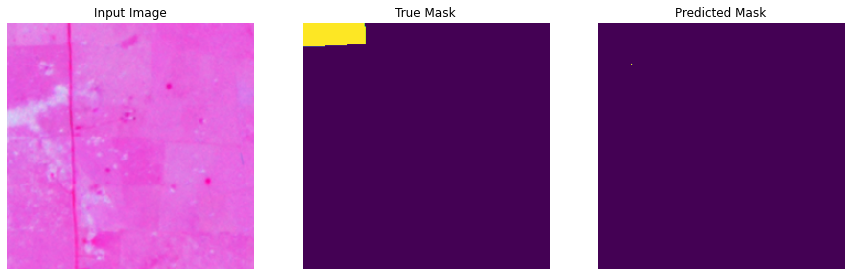

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_10608.png']
[0 7]


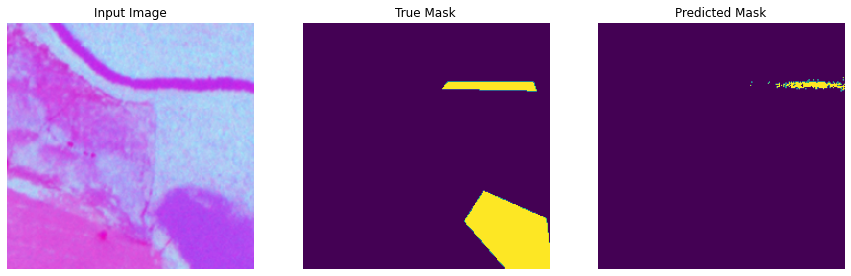

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_20090.png']
[0 1 5]


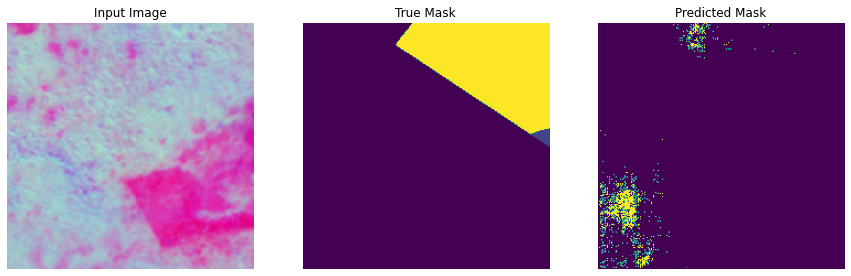

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_15110.png']
[0 1 2 5]


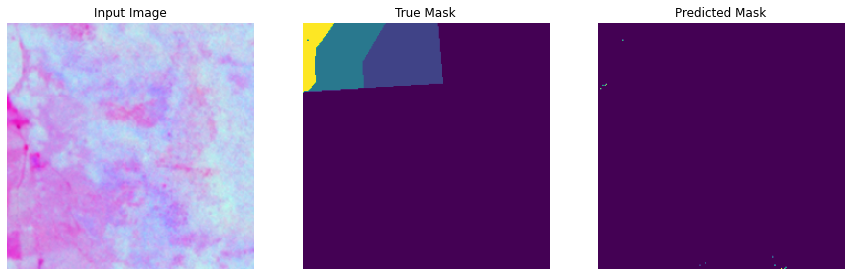

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_19112.png']
[0 6]


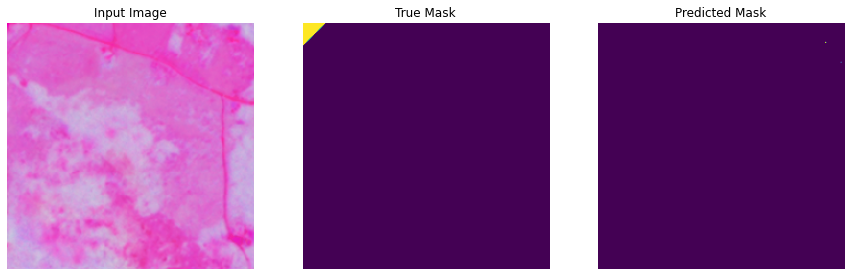

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_23053.png']
[0 2 3 5 6]


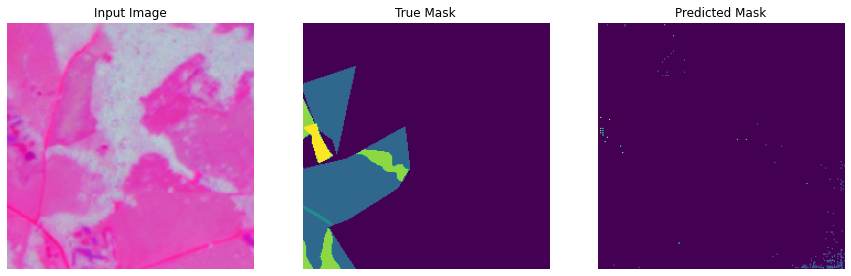

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_20959.png']
[0 2]


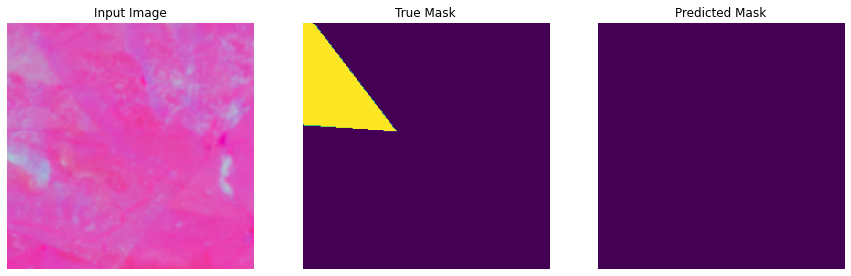

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_31280.png']
[0 5]


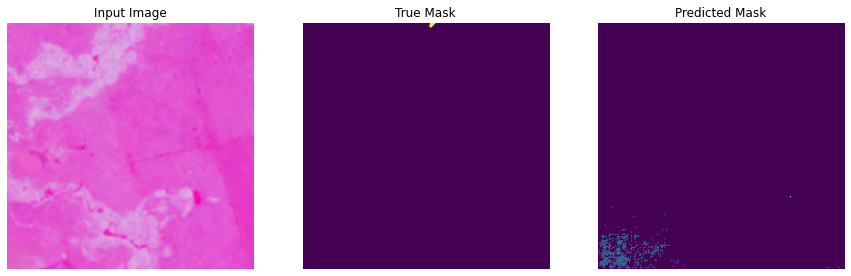

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_21393.png']
[0 2 5 6]


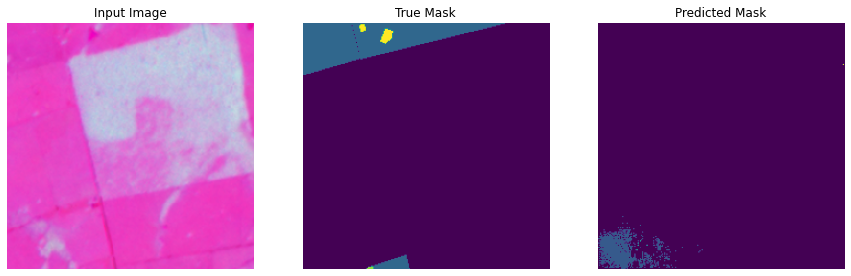

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_8358.png']
[0 7]


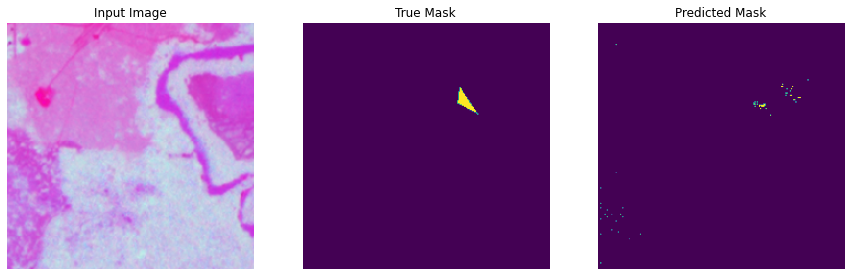

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_32988.png']
[0 5]


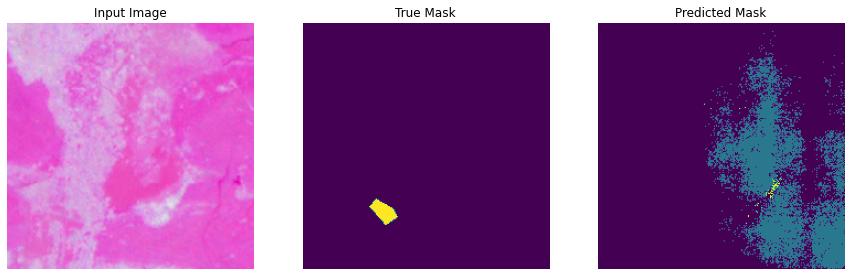

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_17162.png']
[0 2 5]


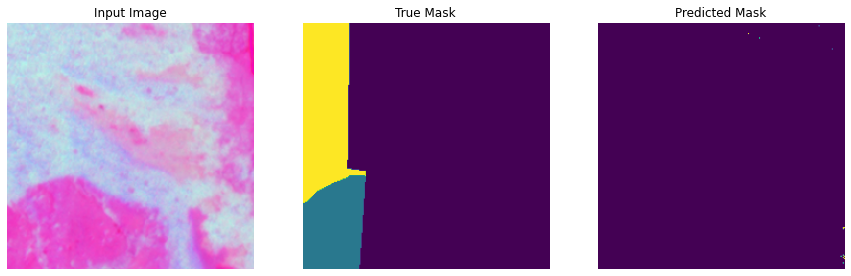

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_21140.png']
[0 2 5]


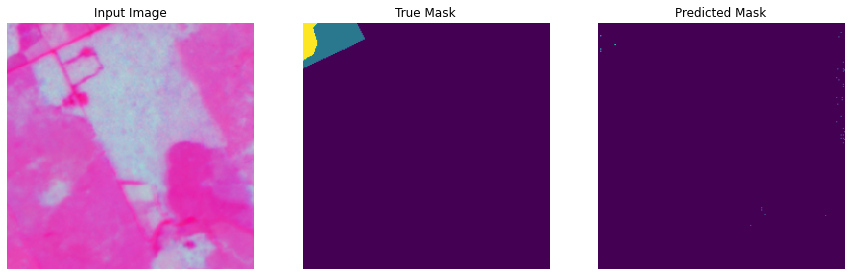

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_35845.png']
[0 6]


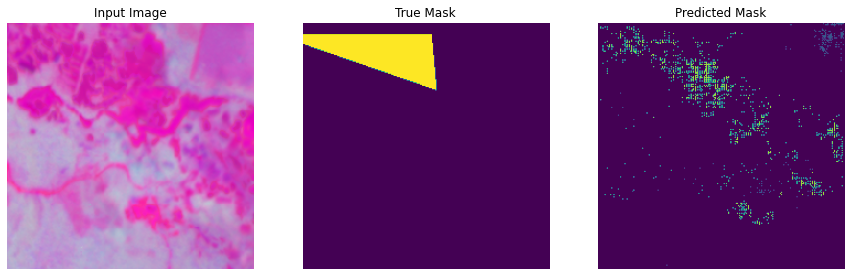

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_14904.png']
[0 2 5 6]


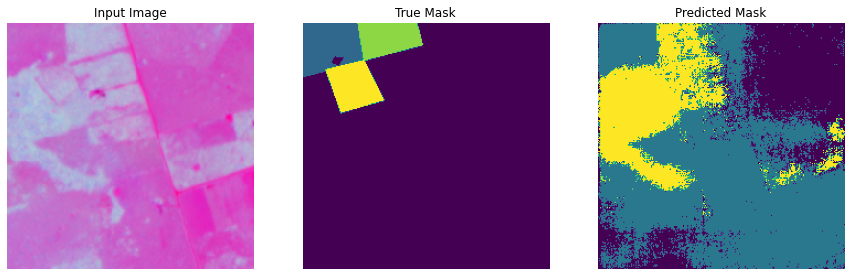

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_18212.png']
[0 6]


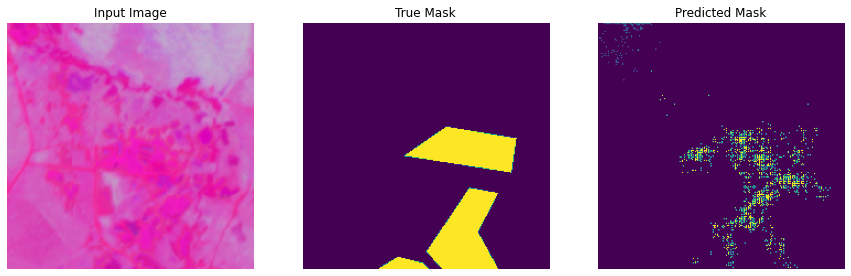

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_20660.png']
[0 5 7]


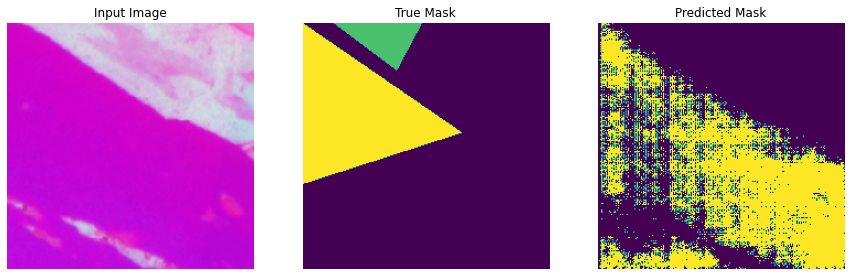

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_13560.png']
[0 7]


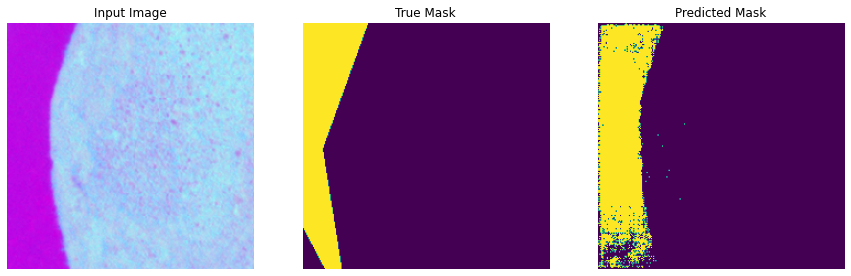

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_23200.png']
[0 2 3 5 6 8]


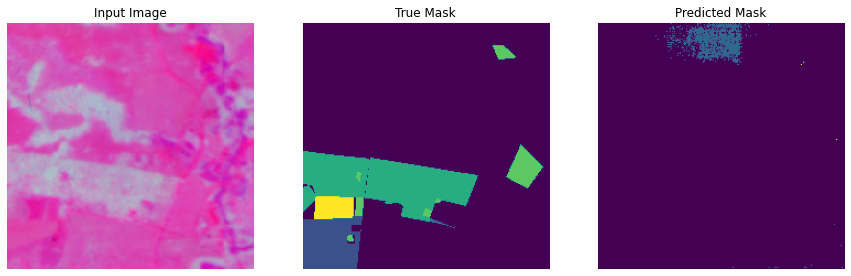

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_15078.png']
[0 5]


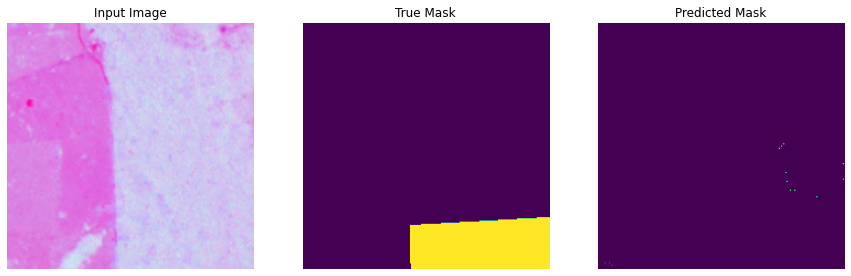

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_22032.png']
[0 7]


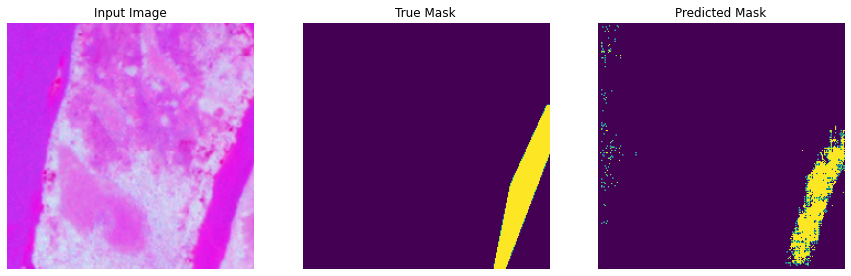

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_32381.png']
[0 1 4]


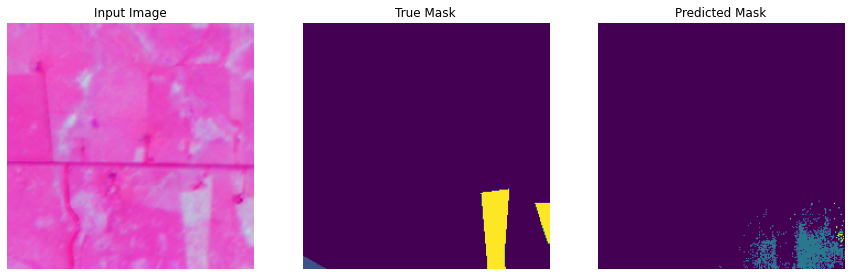

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_24852.png']
[0 2 5]


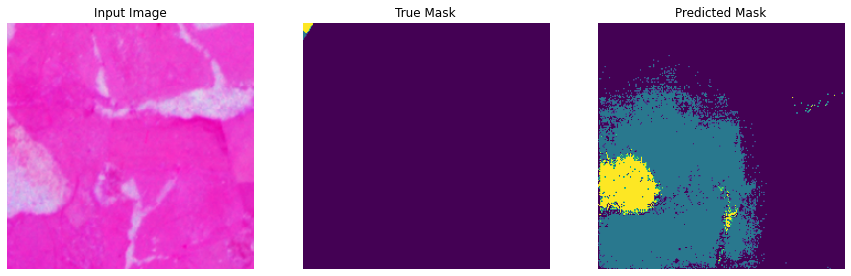

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_6242.png']
[0 5]


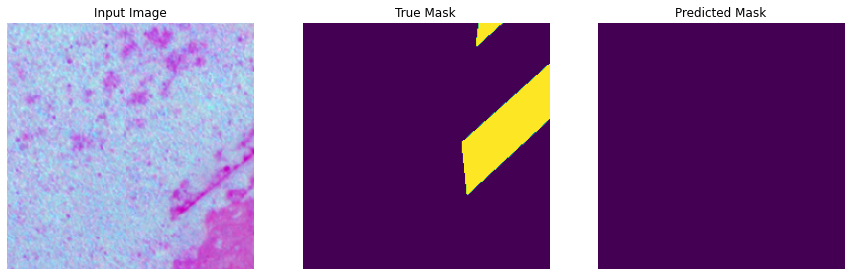

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_28141.png']
[0 2]


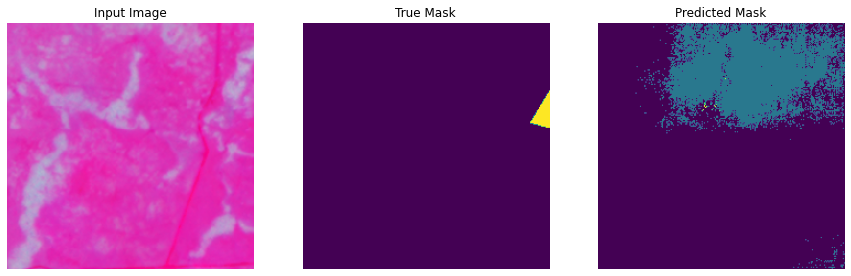

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_23057.png']
[0 2]


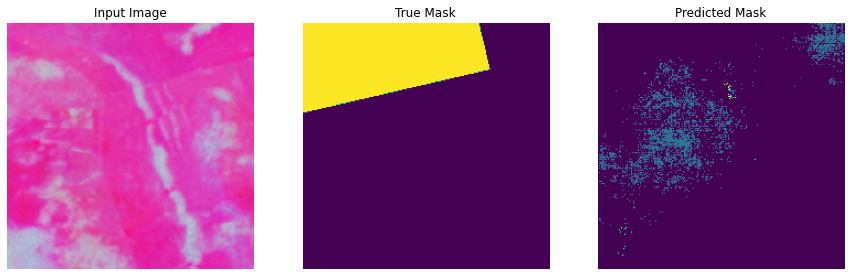

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_17507.png']
[0 7]


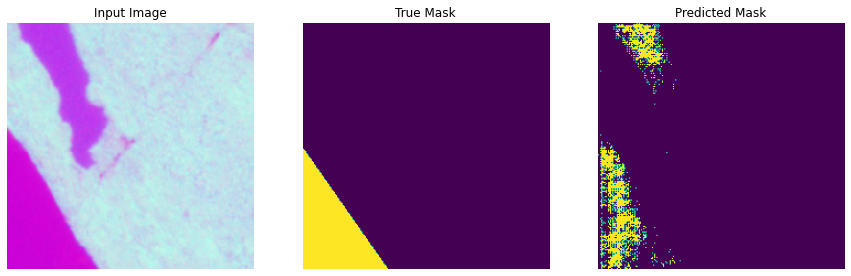

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_20365.png']
[0 2 5 6]


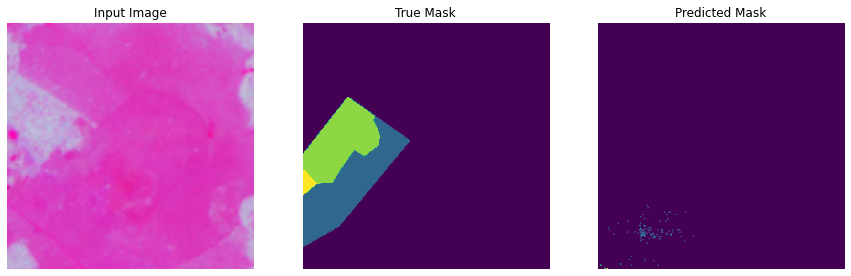

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_32844.png']
[0 5 7]


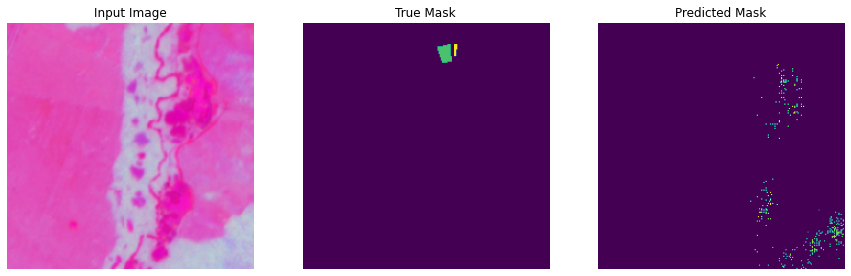

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_18206.png']
[0 5]


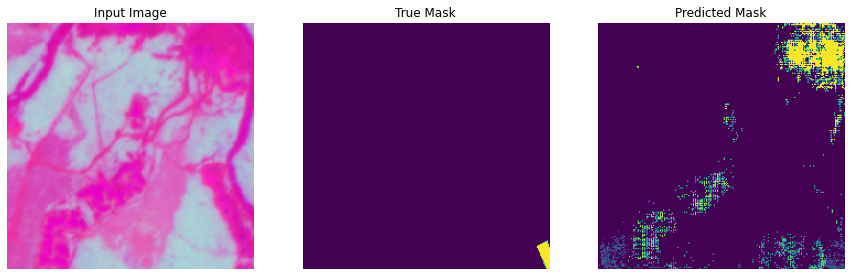

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_22024.png']
[0 7]


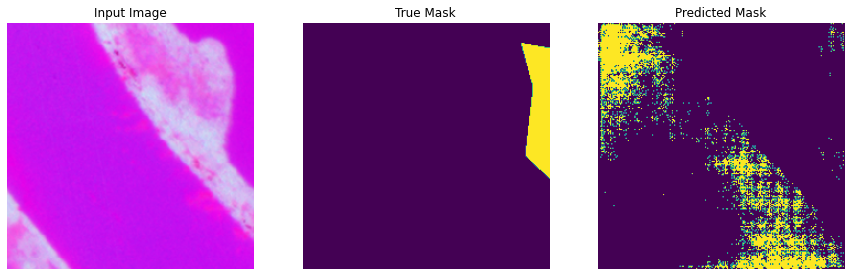

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_16287.png']
[0 6]


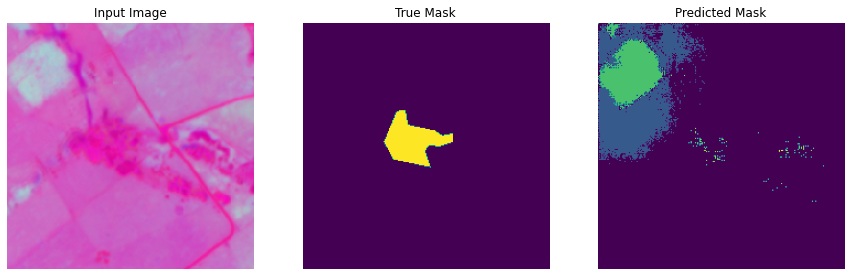

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_34480.png']
[0 6]


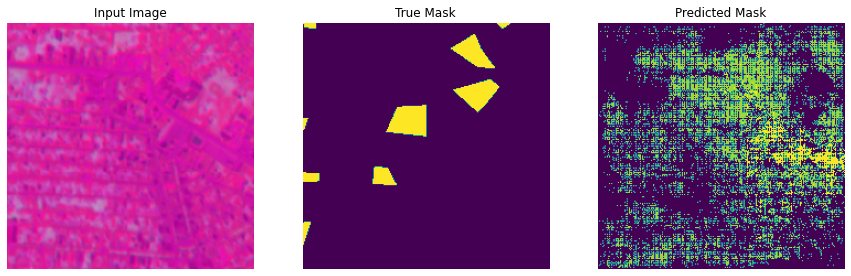

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_21281.png']
[0 2 5]


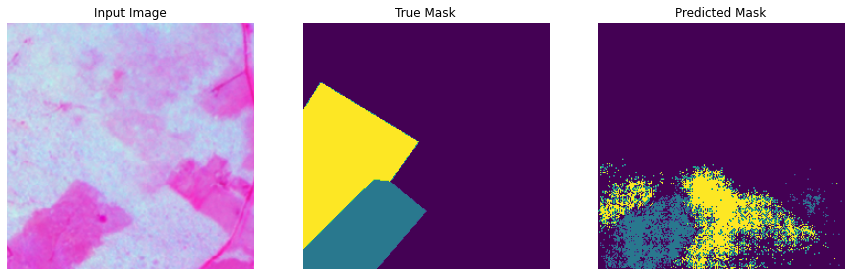

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_14509.png']
[0 5]


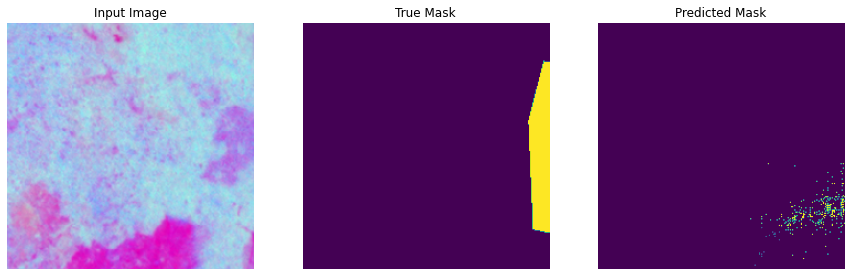

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_22735.png']
[0 1]


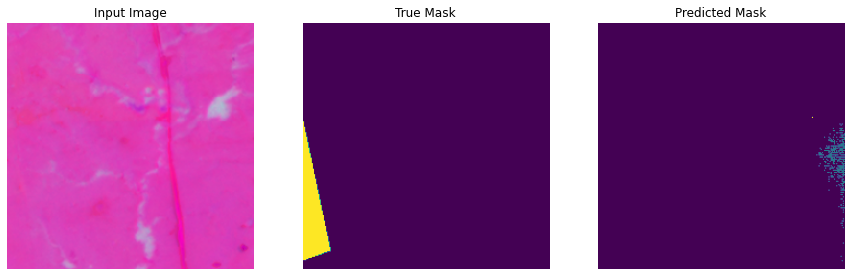

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_21118.png']
[0 7]


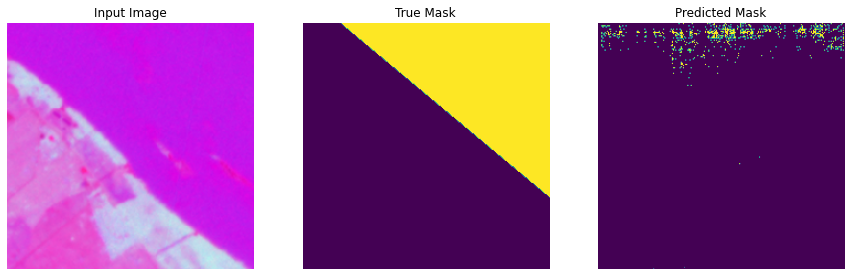

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_20394.png']
[0 7]


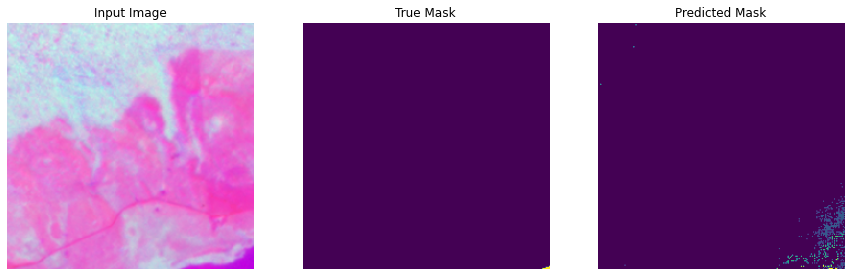

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_10759.png']
[0 7]


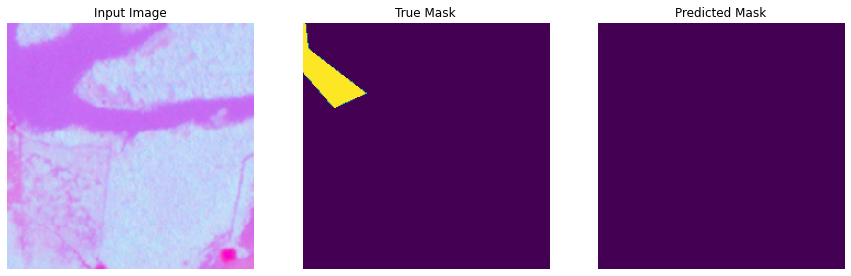

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_19642.png']
[0 1 2 6]


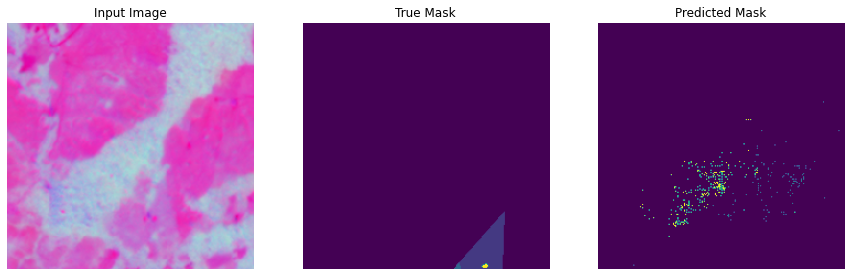

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_16867.png']
[0 1 2 5]


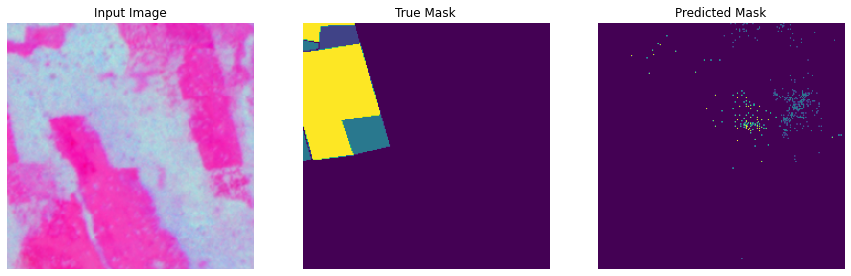

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_34421.png']
[0 5]


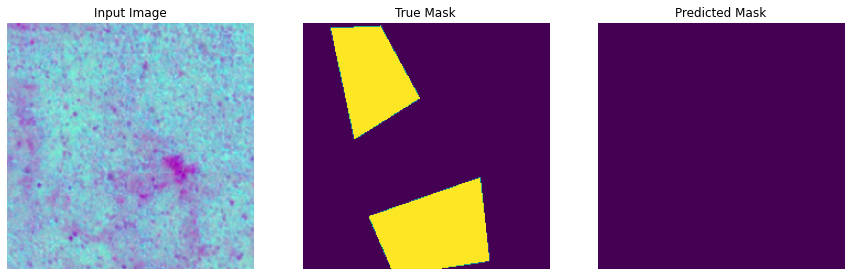

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_23051.png']
[0 1 2]


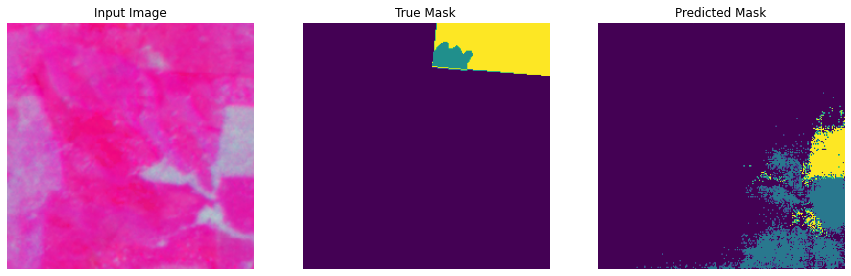

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_24117.png']
[0 5]


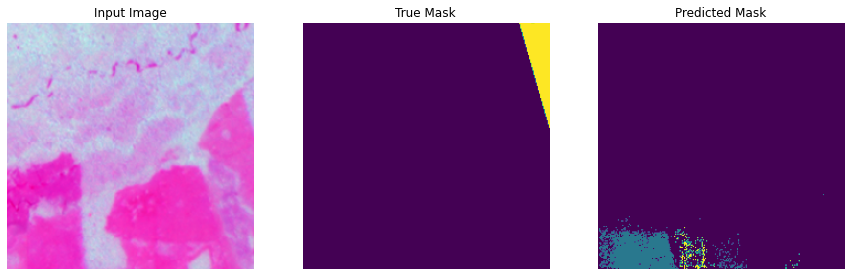

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_22178.png']
[0 5]


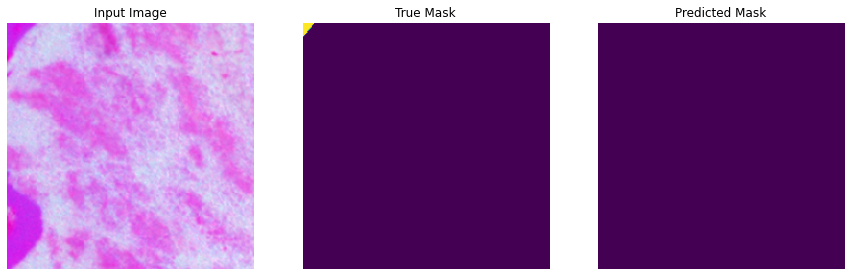

['/content/gdrive/My Drive/servir-tf-devseed/labels/tile_terrabio_19942.png']
[0 1 2 5 6]


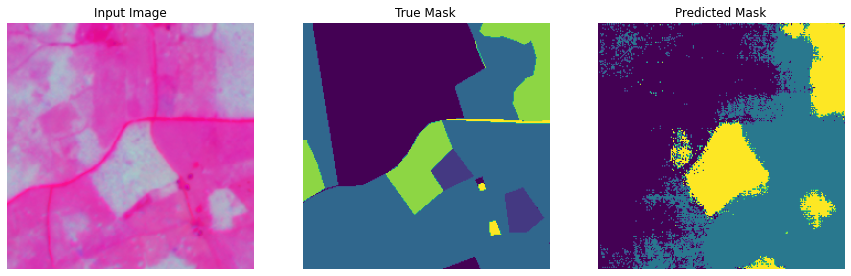

In [61]:
tiled_prediction_dir = os.path.join(root_dir,'predictions_test/')
if not os.path.exists(tiled_prediction_dir):
    os.makedirs(tiled_prediction_dir)
    
pred_masks = []
true_masks = []

for i in range(0, 50):
    img_num = i

    try:
      temp_ds = get_baseline_dataset(foreground_list_x[img_num:img_num+1], 
                                   foreground_list_y[img_num:img_num+1],
                                   preproc_fn=test_preprocessing_fn,
                                   batch_size=1,
                                   shuffle=True)
    except Exception as e: 
      print(str(e))

    # Let's examine some of these augmented images

    iterator = iter(temp_ds)
    next_element = iterator.get_next()

    batch_of_imgs, label = next_element

    # Running next element in our graph will produce a batch of images

    sample_image, sample_mask = batch_of_imgs[0], label[0,:,:,:]
    sample_mask_int = tf.dtypes.cast(sample_mask, tf.int32)
    true_masks.append(sample_mask_int)
    print(foreground_list_y[img_num:img_num+1])
    print(np.unique(sample_mask_int))

    # run and plot predicitions

    show_predictions()
    pred_mask = get_predictions()
    pred_masks.append(pred_mask)
    
    # save prediction images to file

    filename_split = os.path.splitext(foreground_list_x[img_num]) 
    filename_zero, fileext = filename_split 
    basename = os.path.basename(filename_zero) 
    tf.keras.preprocessing.image.save_img(os.path.join(tiled_prediction_dir, basename, ".png"),pred_mask)    

### Evaluate Model

Compute confusion matrix from all predicted images and their ground truth label masks. 

In [62]:
# flatten our tensors and use scikit-learn to create a confusion matrix
flat_preds = tf.reshape(pred_masks, [-1]) 
flat_truth = tf.reshape(true_masks, [-1]) 
cm = confusion_matrix(flat_truth, flat_preds, labels=list(range(OUTPUT_CHANNELS)))

In [63]:
# check values in predicted masks vs truth masks
check_preds = tf.keras.backend.eval(flat_preds)
check_truths = tf.keras.backend.eval(flat_truth)
print(np.unique(check_preds), np.unique(check_truths))

[0 1 2 5 6 7] [0 1 2 3 4 5 6 7 8]


(8.5, -0.5)

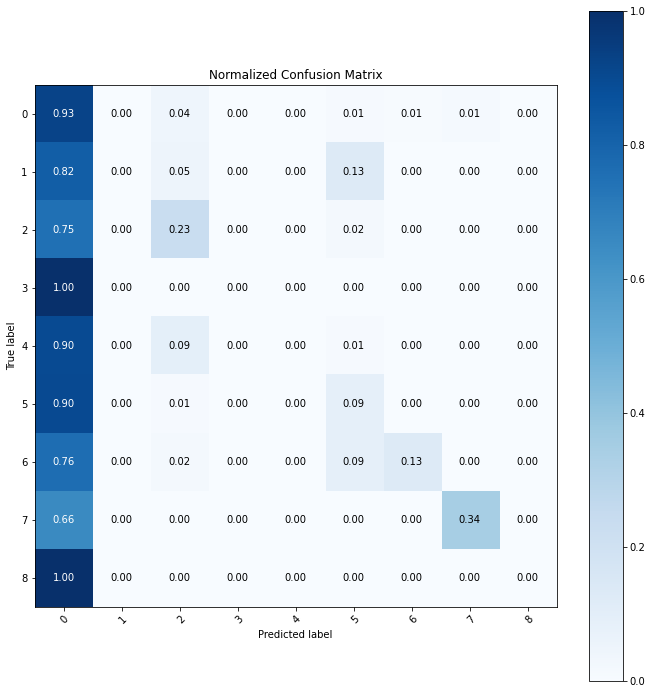

In [64]:
classes = [0,1,2,3,4,5,6,7,8]

%matplotlib inline
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(10, 10))
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)
# We want to show all ticks...
ax.set(xticks=np.arange(cm.shape[1]),
       yticks=np.arange(cm.shape[0]),
       # ... and label them with the respective list entries
       xticklabels=list(range(OUTPUT_CHANNELS)), yticklabels=list(range(OUTPUT_CHANNELS)),
       title='Normalized Confusion Matrix',
       ylabel='True label',
       xlabel='Predicted label')

# Rotate the tick labels and set their alignment.
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
         rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = '.2f' #'d' # if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")
fig.tight_layout(pad=2.0, h_pad=2.0, w_pad=2.0)
ax.set_ylim(len(classes)-0.5, -0.5)

Now let's compute the f1 score

F1 = 2 * (precision * recall) / (precision + recall)


In [65]:
# compute f1 score
f1_score(flat_truth, flat_preds, average='macro')

0.19191787155205967